# Training PyTorch Faster R-CNN for Early Smoke Detection on a HPWREN Dataset

## **0.** Settings

In [2]:
!nvidia-smi  

Wed Nov 15 20:41:48 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        Off | 00000000:01:00.0 Off |                  N/A |
| 30%   26C    P8              12W / 350W |  17627MiB / 24576MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!pip install albumentations==0.4.6
!pip install pycocotools

In [4]:
import sys
sys.path.insert(0,'./detection/')

In [5]:
from torchvision.models.detection.rpn import AnchorGenerator
from albumentations.pytorch.transforms import ToTensorV2
from torchvision.models.detection import FasterRCNN
from engine import train_one_epoch, evaluate
import torchvision.transforms as transform
import matplotlib.pyplot as plt
import albumentations as A
import pandas as pd
import torchvision
import numpy as np
import torch
import cv2
import os

In [8]:
## ===========================
##   GPU
## ===========================

gpu = True

if gpu == True:
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

## **1.** Dataset

In [9]:
!ls ./annotated_hpwren_small

detection_model.pt    train		     valid_annotations.csv
test		      train_annotations.csv
test_annotations.csv  valid


## **2.** Train and validation sets

In [10]:
# Path for annotations (train and validation)
train_csv_path = './annotated_hpwren_small/train_annotations.csv'
valid_csv_path = './annotated_hpwren_small/valid_annotations.csv'

# Path for images (train and validation)
train_images = './annotated_hpwren_small/train'
valid_images = './annotated_hpwren_small/valid'

In [11]:
# Train
train_csv = pd.read_csv(train_csv_path)
train_csv.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,ck0qd8gs6ko7j0721x25cv4o3_jpeg.rf.005f5707706e...,640,480,smoke,125,190,177,286
1,ck0t40rhdz68s0a46ekx049a6_jpeg.rf.00403179fe5f...,640,480,smoke,326,207,494,249
2,ck0m0ch9ugnna07940o8x989j_jpeg.rf.0101cdb46a16...,640,480,smoke,308,166,582,257
3,ck0rr6bfa9b3w0721aw5unwdy_jpeg.rf.00982c053d66...,640,480,smoke,241,204,310,244
4,ck0uk75x5ysls0721e5a9j891_jpeg.rf.00d7fd8503e1...,640,480,smoke,523,208,619,288


In [12]:
# Validation
valid_csv = pd.read_csv(valid_csv_path)
valid_csv.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,ck0k9aqm99o2o0721aml8qpqr_jpeg.rf.028c79a871f1...,640,480,smoke,396,211,493,243
1,ck0ndrnhi3fkn0794vbn53c08_jpeg.rf.00da459deaa7...,640,480,smoke,195,205,213,225
2,ck0ncvnd332hj079400vhocib_jpeg.rf.01edcd18890b...,640,480,smoke,1,170,160,325
3,ck0ovrdff7ir20848kelskyn8_jpeg.rf.1424f9ef8aad...,640,480,smoke,312,114,560,259
4,ck0tx0999u6br0944s68atde0_jpeg.rf.0e5c93b75738...,640,480,smoke,238,256,526,315


## **3.** Labels encoding

In [13]:
# Define categories
categories = train_csv['class'].unique()
print(categories)

['smoke']


In [14]:
## Encode the categories with integers
## (the train set define the encodings, the other sets have to adapt to that encodings)

# ====================
#   Train set
# ====================
class LabelMap:

    def __init__(self, categories):
        
        self.map_dict = {}
        self.reverse_map_dict = {}

        # Assign to every category an integer (starting from 1)
        for i, cat in enumerate(categories):
            self.map_dict[cat] = i + 1
            self.reverse_map_dict[i] = cat

    def fit(self, df, column):
        df[column] = df[column].map(self.map_dict)
        return df

# ====================
#   Other sets
# ====================
def encode_label(df, column, map_dict):
    df[column] = df[column].map(map_dict)
    return df

In [15]:
# Create an instance of the class
label_map = LabelMap(categories)

In [16]:
# Encode the labels of the train set
train_csv = label_map.fit(train_csv, 'class')
train_csv.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,ck0qd8gs6ko7j0721x25cv4o3_jpeg.rf.005f5707706e...,640,480,1,125,190,177,286
1,ck0t40rhdz68s0a46ekx049a6_jpeg.rf.00403179fe5f...,640,480,1,326,207,494,249
2,ck0m0ch9ugnna07940o8x989j_jpeg.rf.0101cdb46a16...,640,480,1,308,166,582,257
3,ck0rr6bfa9b3w0721aw5unwdy_jpeg.rf.00982c053d66...,640,480,1,241,204,310,244
4,ck0uk75x5ysls0721e5a9j891_jpeg.rf.00d7fd8503e1...,640,480,1,523,208,619,288


In [17]:
# Encode the labels of the validation set
valid_csv = encode_label(valid_csv, 'class', label_map.map_dict)
valid_csv.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,ck0k9aqm99o2o0721aml8qpqr_jpeg.rf.028c79a871f1...,640,480,1,396,211,493,243
1,ck0ndrnhi3fkn0794vbn53c08_jpeg.rf.00da459deaa7...,640,480,1,195,205,213,225
2,ck0ncvnd332hj079400vhocib_jpeg.rf.01edcd18890b...,640,480,1,1,170,160,325
3,ck0ovrdff7ir20848kelskyn8_jpeg.rf.1424f9ef8aad...,640,480,1,312,114,560,259
4,ck0tx0999u6br0944s68atde0_jpeg.rf.0e5c93b75738...,640,480,1,238,256,526,315


## **4.** Prepare the data

In [18]:
class WildFireSmoke_Dataset(torch.utils.data.Dataset):

    def __init__(self, df, image_path, categories, transforms=None, **kwargs):
        super().__init__(**kwargs)
        self.df         = df
        self.image_path = image_path
        self.categories = categories
        self.images     = self.df['filename'].unique()
        self.transforms = transforms

    def __len__(self):
        return len(self.images)

    #------------------------------------------------------------------------ Extract 'idx'-th item ---------#
    def __getitem__(self, idx):                                                                              #
                                                                                                             #
        # Define the 'idx'-th image path                                                                     #
        image_file = os.path.join(self.image_path, self.images[idx])                                         #
                                                                                                             #
        # Get the image                                                                                      #
        img = cv2.imread(image_file)                                                                         #
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)                                                           #
        img = img.astype(np.float32)                                                                         #
        img = img/255.0                                                                                      #
                                                                                                             #
        # Get the box/s coordinates for each element                                                         #
        image_data = self.df[self.df['filename'] == self.images[idx]]                                        #      
        xmins = image_data['xmin'].values                                                                    #
        ymins = image_data['ymin'].values                                                                    #
        xmaxs = image_data['xmax'].values                                                                    #
        ymaxs = image_data['ymax'].values                                                                    #
                                                                                                             #
        # Convert everything into a torch.Tensor                                                             #
        boxes = torch.as_tensor(np.stack([xmins, ymins, xmaxs, ymaxs], axis=1), dtype=torch.float32)         #
        labels = torch.as_tensor(image_data['class'].values, dtype=torch.int64)                              #
        image_id = torch.tensor([idx])                                                                       #
                                                                                                             #
        # Calculate the area/s of the box/s                                                                  #
        areas = (boxes[:,3] - boxes[:,1]) * (boxes[:,2] - boxes[:,0])                                        #
        areas = torch.as_tensor(areas, dtype=torch.float32)                                                  #
                                                                                                             #
        # Format                                                                                             #
        iscrowd = torch.zeros((len(labels),), dtype=torch.int64)                                             #
                                                                                                             #
        # Target (dict) definition                                                                           #
        target = {}                                                                                          #
        target['boxes']    = boxes                                                                           #
        target['labels']   = labels                                                                          #
        target['image_id'] = image_id                                                                        #
        target['area']     = areas                                                                           #
        target['iscrowd']  = iscrowd                                                                         #
                                                                                                             #
        # Data transformations                                                                               # 
        if self.transforms is not None:                                                                      #
                                                                                                             #
            # Define transformation                                                                          #
            transformed = self.transforms(image=img, bboxes=boxes, labels=labels)                            #
                                                                                                             #
            # Image transformation                                                                           #
            img = transformed['image']                                                                       # 
                                                                                                             #
            # Target transformation                                                                          #
            target['boxes'] = torch.as_tensor(transformed['bboxes'], dtype=torch.float32)                    #
                                                                                                             #
        return torch.as_tensor(img, dtype=torch.float32), target                                             #
    #--------------------------------------------------------------------------------------------------------#

    def get_height_and_width(self, image):
        image_data = self.df.loc[self.df['filename'] == image]
        return image_data['width'].values[0], image_data['height'].values[0]

In [19]:
# Train set transformations
transform_train = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    ToTensorV2(p=1)], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

# Validation set transformations
transform_valid = A.Compose([
    ToTensorV2(p=1)], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

In [20]:
# Define a custom collate: collate_fn
# (it collates the input samples into a batch to then pass the whole batch to the data loader iterator)

def collate_fn(batch):
    return tuple(zip(*batch))

In [21]:
# Finally import train and validation
train_dataset = WildFireSmoke_Dataset(train_csv, train_images, categories, transform_train)
valid_dataset = WildFireSmoke_Dataset(valid_csv, valid_images, categories, transform_valid)

data_loader_train = torch.utils.data.DataLoader(
        train_dataset, 
        batch_size  = 4, 
        shuffle     = True, 
        num_workers = 2,
        collate_fn  = collate_fn)
    
data_loader_valid = torch.utils.data.DataLoader(
        valid_dataset, 
        batch_size  = 4, 
        shuffle     = False, 
        num_workers = 2,
        collate_fn  = collate_fn)

## **5.** Plot images and boxes

In [24]:
def plot_images(images, targets):

    max_images = 4
    count_imgs = 0

    for image, target in zip(images, targets):

        if count_imgs == max_images:
            break

        count_imgs += 1

        # Get the image and the boxes in the right format
        sample = image.permute(1,2,0).cpu().numpy()
        boxes  = target['boxes'].cpu().numpy().astype(np.int32)

        # Define the plot
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))

        # Plot the boxes
        for box in boxes:
            cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (1,0,0), 2)
                           
            cv2.putText(sample, 'smoke', 
                      (box[0], box[1]-10), cv2.FONT_HERSHEY_DUPLEX, 0.8, (1,0,0), 2)

        # Additional
        ax.set_axis_off()
        ax.imshow((sample * 255).astype(np.uint8))

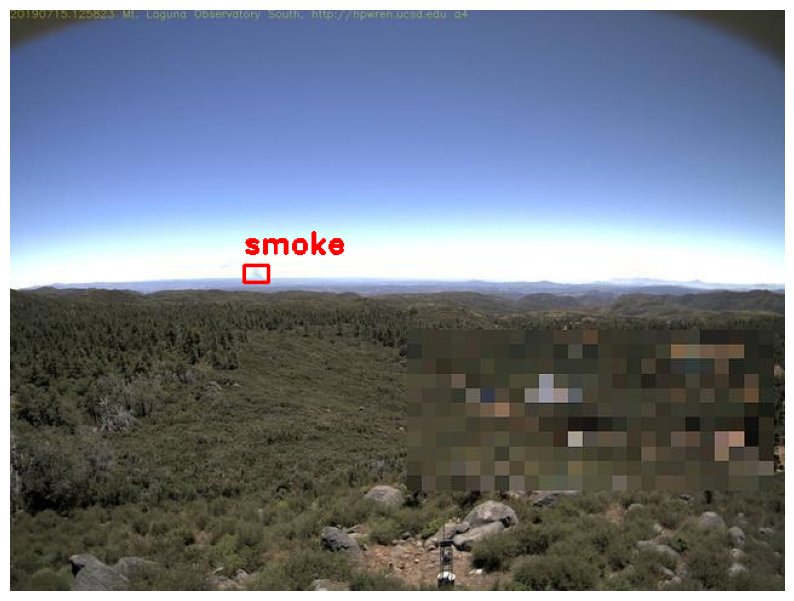

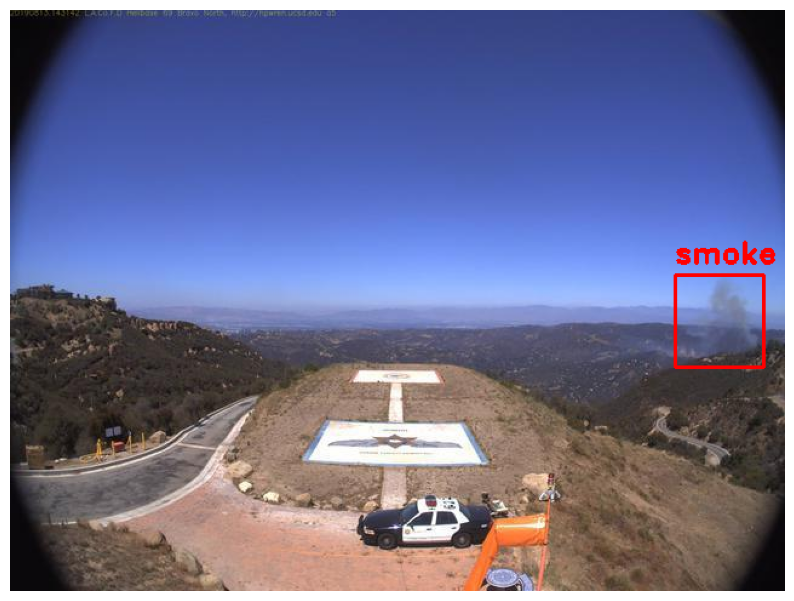

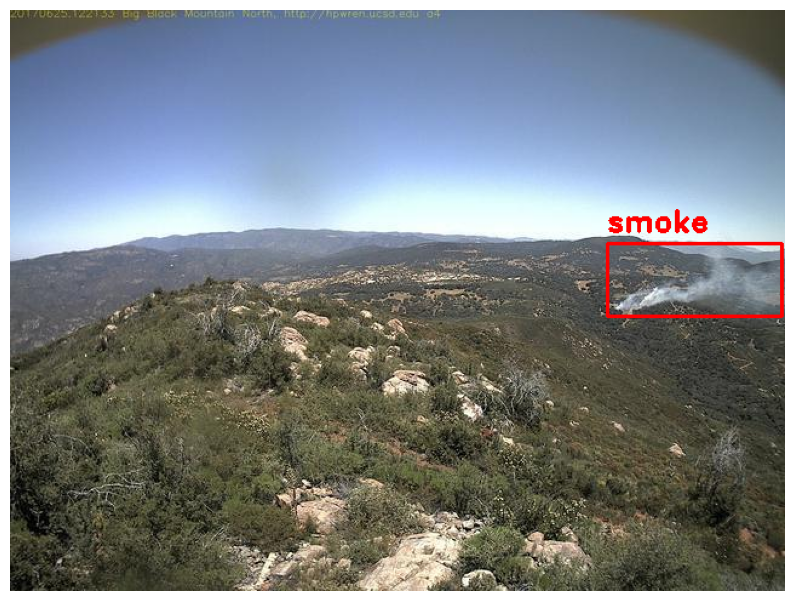

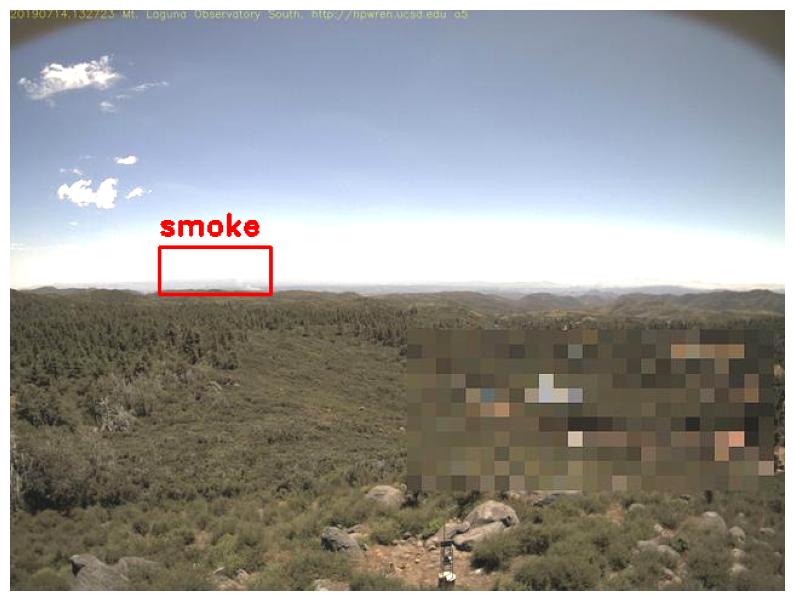

In [25]:
# Train set - images and boxes
images, targets = next(iter(data_loader_train))
plot_images(images, targets)

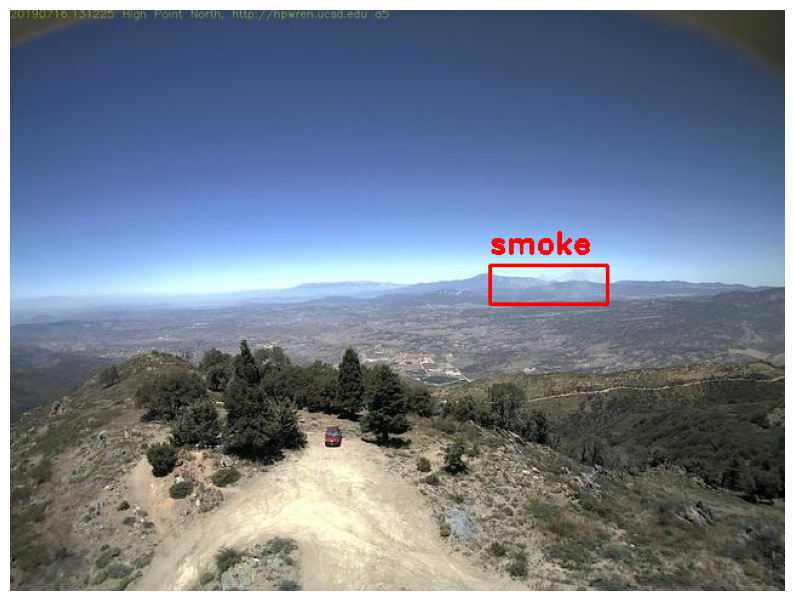

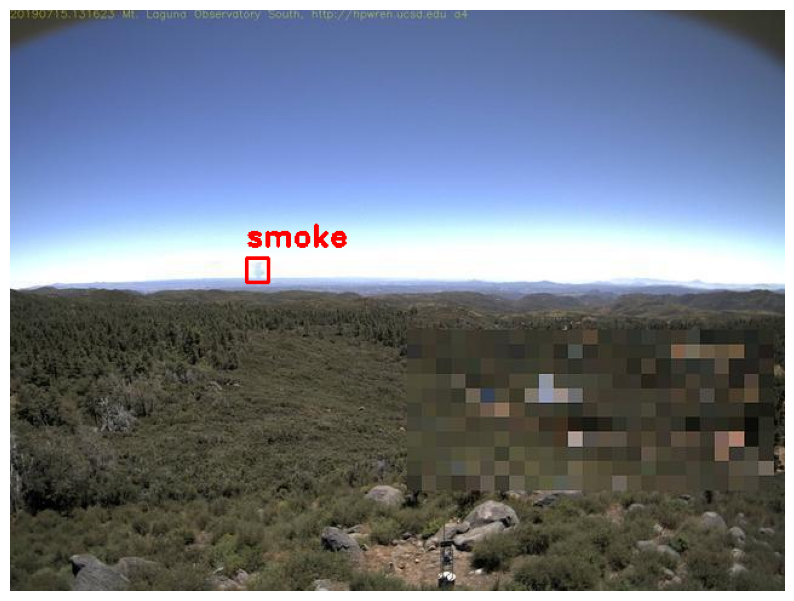

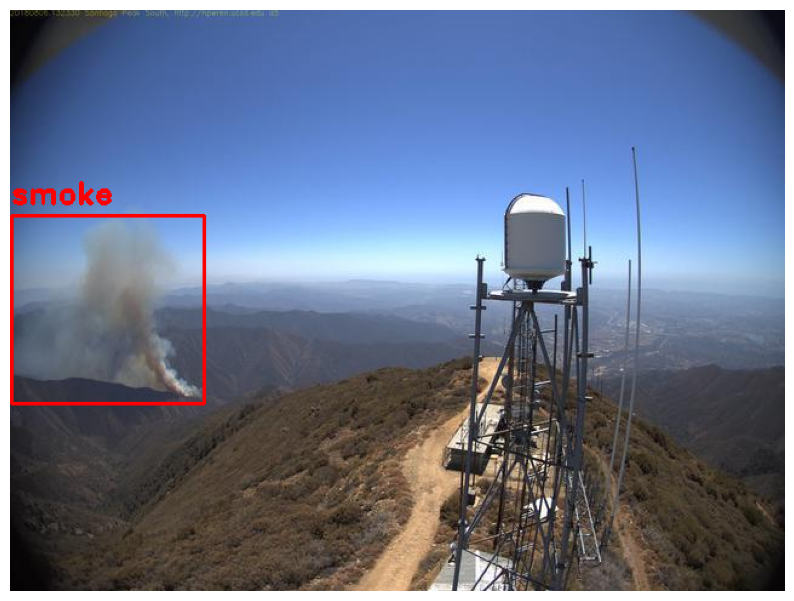

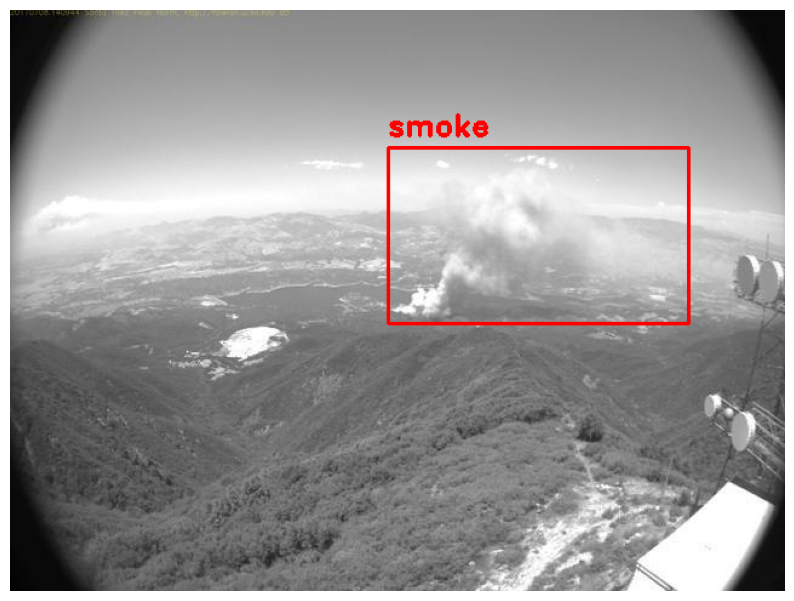

In [26]:
# Validation set - images and boxes
images, targets = next(iter(data_loader_valid))
plot_images(images, targets)

## **6.** Model definition

### **6.1.** Import the pre-trained model

Available models, pre-trained on COCO dataset, at https://pytorch.org/vision/master/models/faster_rcnn.html.

In [27]:
# Transfer learning: load a model pre-trained on COCO
detection_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/home/calvinzhou/miniconda3/envs/py39-frcnn/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/calvinzhou/miniconda3/envs/py39-frcnn/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### **6.2.** Adjust the classifier

In [28]:
## Replace the classifier with a new one, that has num_classes which is user-defined

# Define the number of classes (len(categories) + 'background')
num_classes = len(categories) + 1

# Get the number of input features for the classifier
in_features = detection_model.roi_heads.box_predictor.cls_score.in_features

# Replace the pre-trained head with a new one
detection_model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

### **6.3.** Move the model to `device`

In [29]:
# Move the model to 'device'
detection_model = detection_model.to(device)

## **7.** Training

In [30]:
def training(model, train_loader, val_loader, epochs):
    
    # Optimizer and learning rate
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    
    # Adapter
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

    for epoch in range(epochs):

        # Train for one epoch, printing every 'print_freq'
        train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=len(data_loader_train))

        # Update the learning rate
        lr_scheduler.step()
        
        # Evaluate on the validation set
        evaluate(model, val_loader, device=device)

training(detection_model, data_loader_train, data_loader_valid, epochs=20)

Epoch: [0]  [  0/129]  eta: 0:03:01  lr: 0.000044  loss: 0.6627 (0.6627)  loss_classifier: 0.4755 (0.4755)  loss_box_reg: 0.0417 (0.0417)  loss_objectness: 0.1342 (0.1342)  loss_rpn_box_reg: 0.0112 (0.0112)  time: 1.4100  data: 0.0925  max mem: 4013
Epoch: [0]  [128/129]  eta: 0:00:00  lr: 0.005000  loss: 0.1495 (0.2173)  loss_classifier: 0.0385 (0.0877)  loss_box_reg: 0.0983 (0.0930)  loss_objectness: 0.0029 (0.0296)  loss_rpn_box_reg: 0.0036 (0.0069)  time: 0.2274  data: 0.0061  max mem: 4171
Epoch: [0] Total time: 0:00:30 (0.2361 s / it)
creating index...
index created!
Test:  [ 0/37]  eta: 0:00:07  model_time: 0.1138 (0.1138)  evaluator_time: 0.0020 (0.0020)  time: 0.2053  data: 0.0857  max mem: 4171
Test:  [36/37]  eta: 0:00:00  model_time: 0.0969 (0.0978)  evaluator_time: 0.0018 (0.0018)  time: 0.1083  data: 0.0055  max mem: 4171
Test: Total time: 0:00:04 (0.1107 s / it)
Averaged stats: model_time: 0.0969 (0.0978)  evaluator_time: 0.0018 (0.0018)
Accumulating evaluation results..

In [31]:
# ======================================
#   SAVE THE MODEL
# ======================================

# Path for saving the best model
path_best_model = './annotated_hpwren_small/'

# Save the model
torch.save(detection_model.state_dict(), path_best_model + 'detection_model.pt')

## **8.** Prediction

In [34]:
# Path of the best model
path_best_model = './annotated_hpwren_small/'

# Load the model
detection_model.load_state_dict(torch.load(path_best_model + 'detection_model.pt'))

<All keys matched successfully>

In [39]:
# Path for annotations (test)
test_csv_path = './annotated_hpwren_small/test_annotations.csv'

# Path for images (test)
test_images = './annotated_hpwren_small/test'

# Test
test_csv = pd.read_csv(test_csv_path)

# Encode the labels of the test set
test_csv = encode_label(test_csv, 'class', label_map.map_dict)

# Test set transformations
transform_test = A.Compose([
    ToTensorV2(p=1)], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

# Finally import test
test_dataset = WildFireSmoke_Dataset(test_csv, test_images, categories, transform_test)

data_loader_test = torch.utils.data.DataLoader(
        test_dataset, 
        batch_size  = 4, 
        shuffle     = True, 
        num_workers = 2,
        collate_fn  = collate_fn)

In [40]:
def view_sample(loader, model, device, threshold):

    images, targets = next(iter(loader))
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    boxes_gt = targets[0]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[0].permute(1,2,0).cpu().numpy()
    
    model.to(device)
    model.eval()
    cpu_device = torch.device('cpu')

    outputs = model(images)
    outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
    
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))

    # Paint ground_truth boxes (red)
    for box in boxes_gt:
        color_red = (1,0,0)
        cv2.rectangle(sample,
              (box[0], box[1]),
              (box[2], box[3]),
              color_red, 2)
             
    boxes = outputs[0]['boxes'].data.cpu().numpy()
    scores = outputs[0]['scores'].data.cpu().numpy()
          
    # Paint predicted boxes (blue)
    pred_box_count = 0
    for box, p in zip(boxes, scores):        
        if p > threshold:
            pred_box_count += 1
            color_blue = (0,0,1)
            pt1 = (int(box[0]), int(box[1]))
            pt2 = (int(box[2]), int(box[3]))
            cv2.rectangle(sample, pt1, pt2, color_blue, 2)
                      
    print(f'Predicted {pred_box_count} BBoxes (blue); Number of GT BBoxes (red) : {len(boxes_gt)}')
    ax.set_axis_off()
    ax.imshow((sample * 255).astype(np.uint8))      

Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1
Predicted 1 BBoxes (blue); Number of GT BBoxes (red) : 1


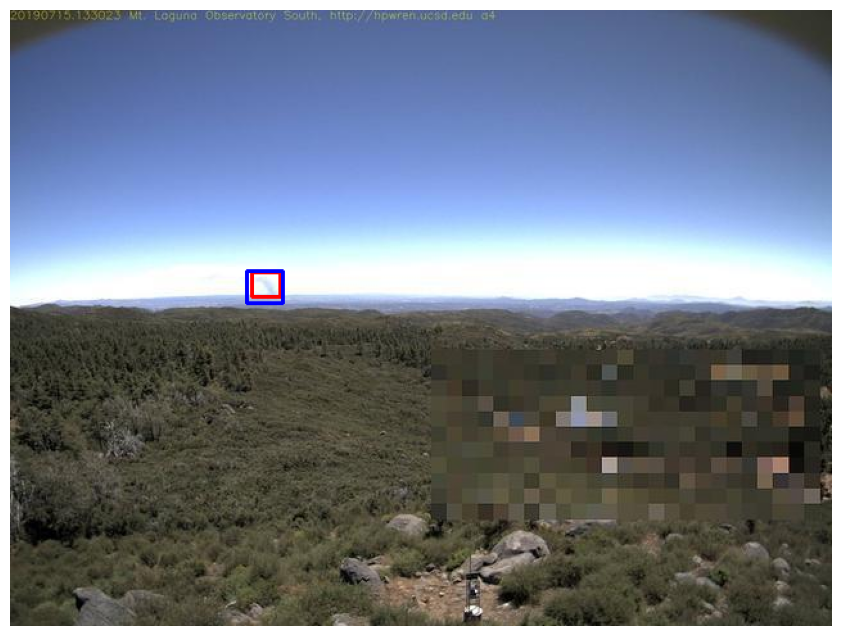

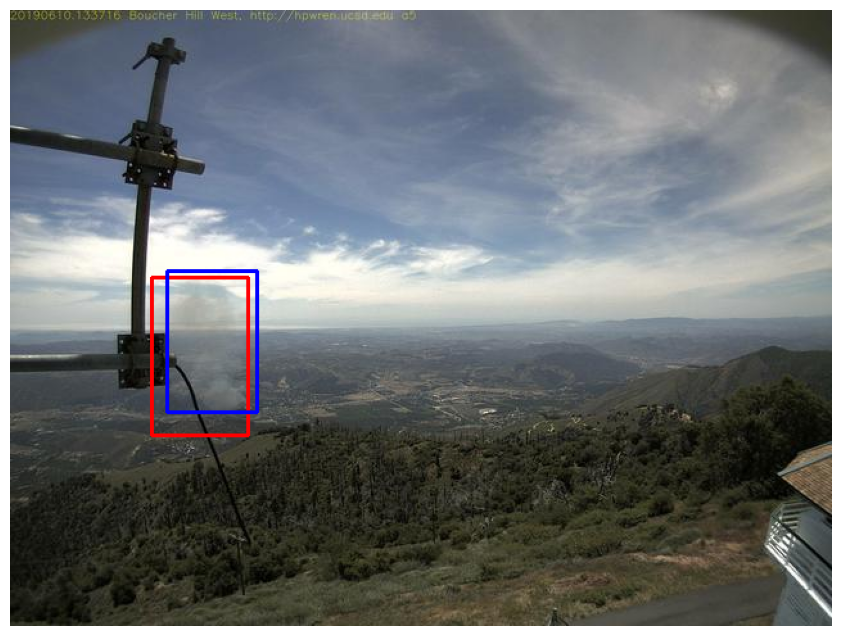

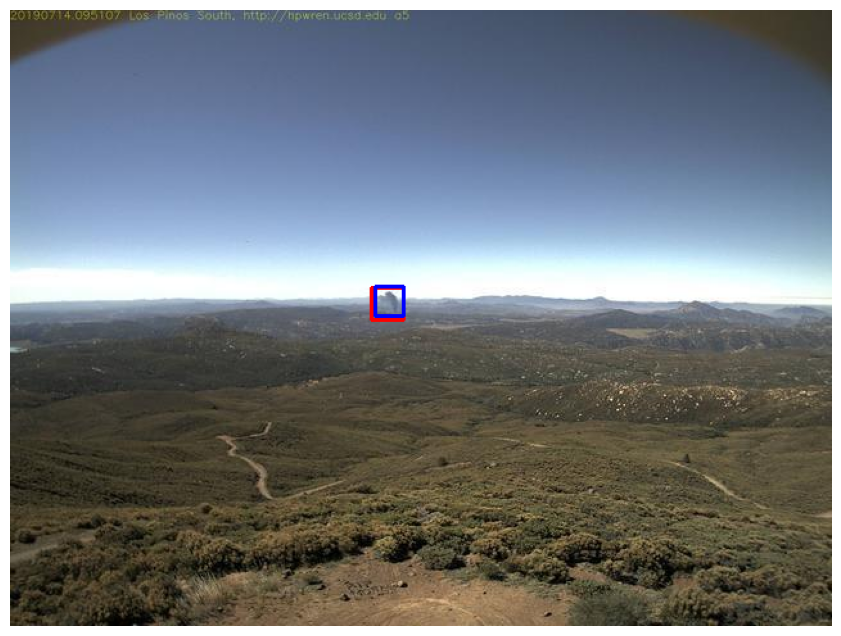

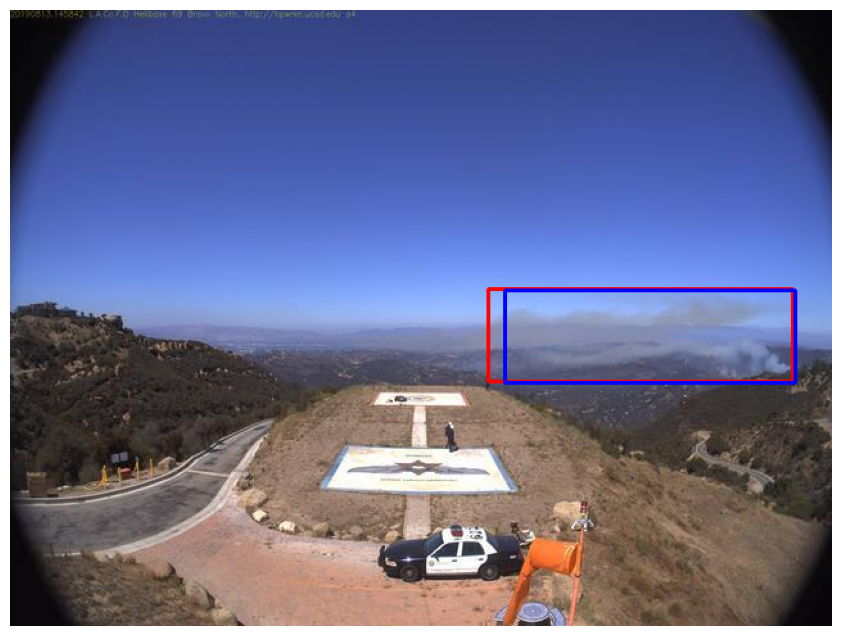

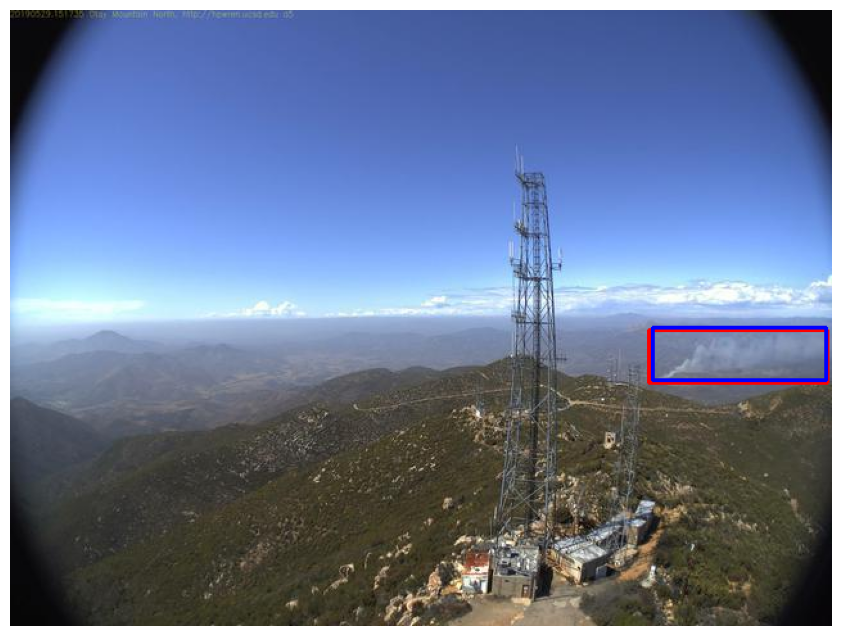

...

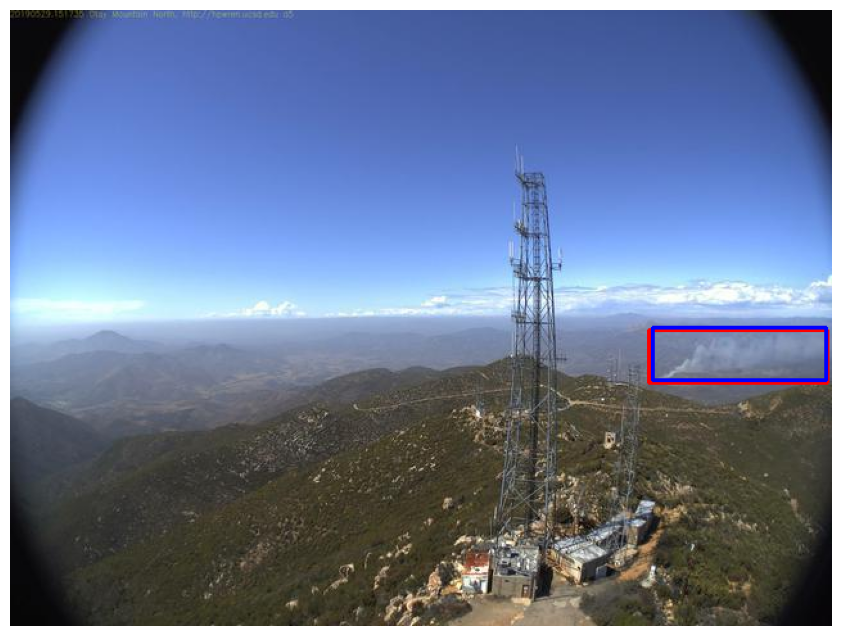

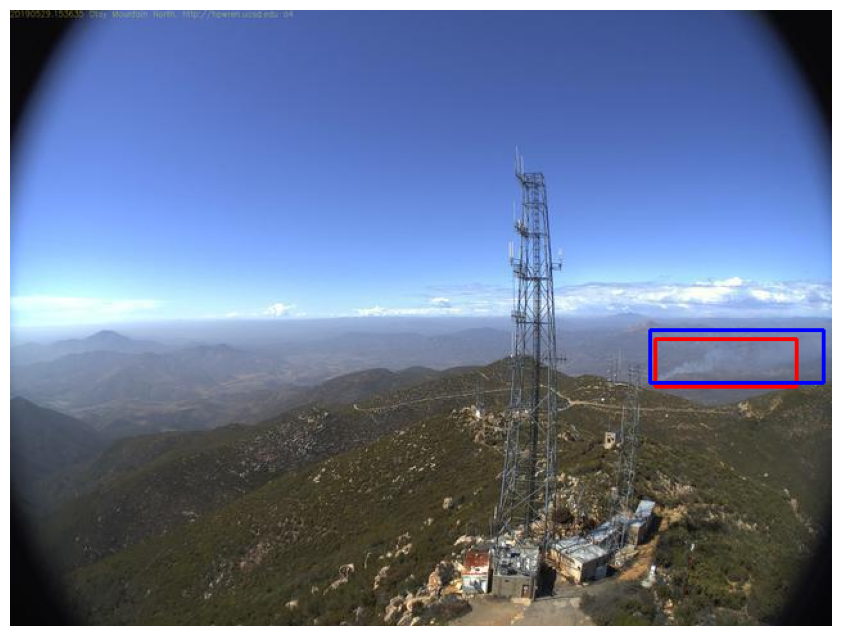

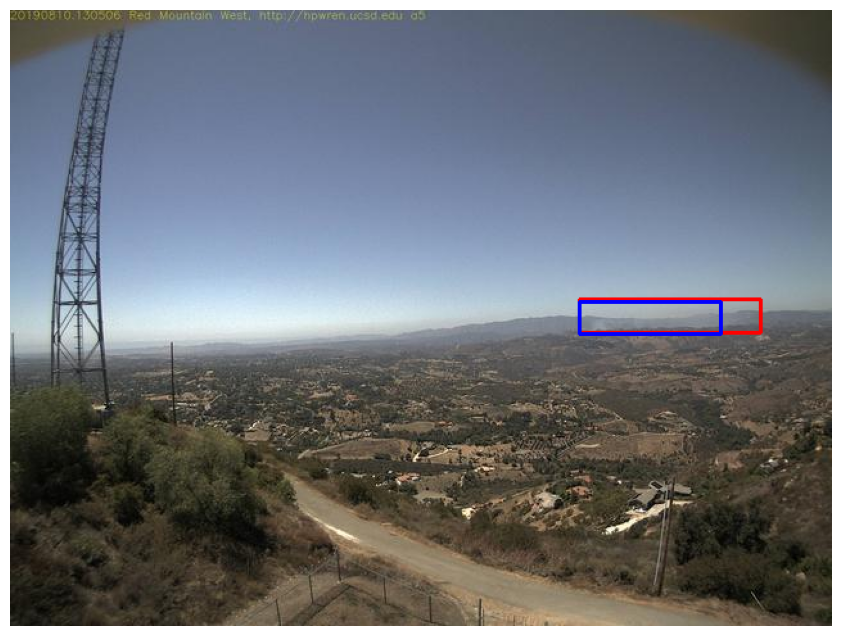

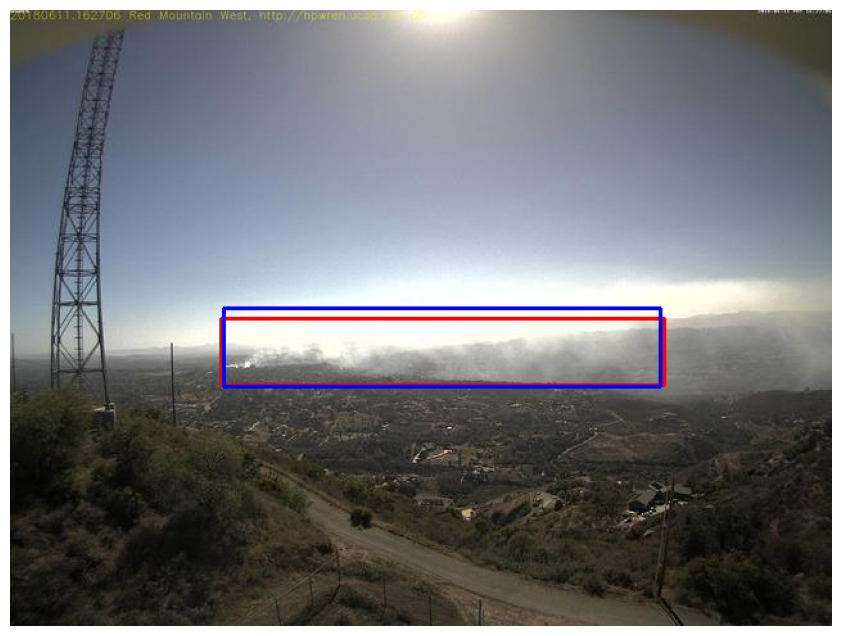

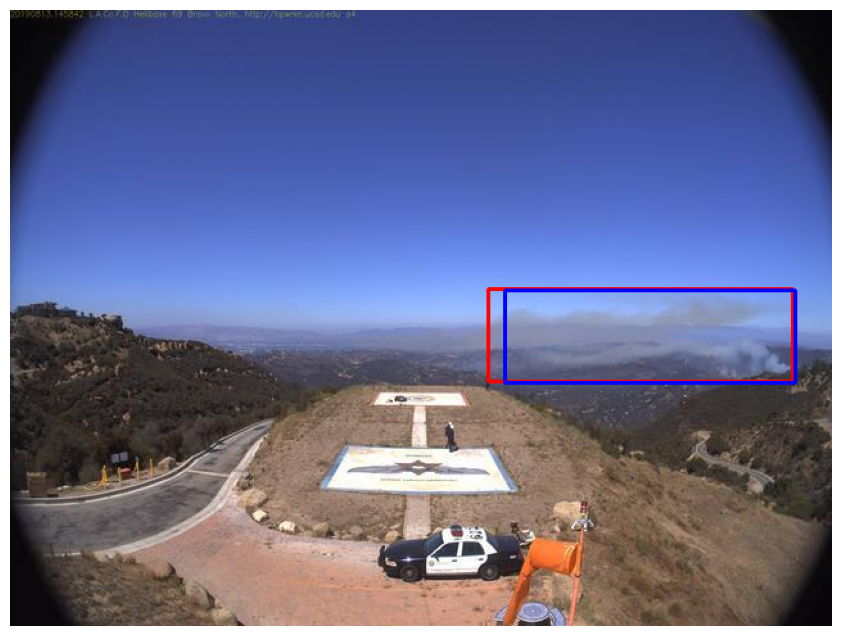

In [41]:
# Show predictions
for i in range(16):
    view_sample(data_loader_test, detection_model, device, 0.6)

## **9.** Sources

[**1**] PyTorch - Detection functions - https://github.com/pytorch/vision/tree/main/references/detection<br>
[**2**] PyTorch - Tutorials - https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html<br>
[**3**] Dataset (format: CSV - Tensorflow Object Detection) - https://public.roboflow.com/object-detection/wildfire-smoke<br> 
[**4**] Kaggle - Starting code - https://www.kaggle.com/code/tarunbisht11/torchvision-object-detection<br>